In [1]:
## Import the various libraries
import os
import pandas as pd

import xgboost as xgb
import catboost as cb
import lightgbm as lgb

import pickle

import matplotlib.pyplot as plt

import warnings
# warnings.filterwarnings(action='once')
# warnings.filterwarnings("ignore", message="numpy.dtype size changed")

import shap

import seaborn as sns

In [2]:
## Load the models trained in mainPhen
with open("saveModels/xgboostModel.dat", "rb") as f:
    modelXGB_final= pickle.load(f)
    
with open("saveModels/catboostModel.dat", "rb") as f:
    modelCAT_final= pickle.load(f)
    
with open("saveModels/lightgbmModel.dat", "rb") as f:
    modelLGB_final= pickle.load(f)    
    
with open("saveModels/lightgbmModel_noGPU.dat", "rb") as f:
    modelLGB_noGPU_final= pickle.load(f)        
    
with open("saveModels/datasetCategoricalSI.dat", "rb") as f:
    df_cat= pickle.load(f)   

In [3]:
# split data into X and y
X_cat = df_cat.iloc[:,1:]
Y = df_cat[["SiteIndex"]]

## Change the name of the less obvious columns
columnName=list(X_cat.columns)
print(columnName)
columnName[26]='dtm_elevation'
columnName[54]='CN_ratio'
columnName[55]='LAI'
print("\n")
print(columnName)

['annual.temp', 'summer.temp', 'autumn.temp', 'winter.temp', 'spring.temp', 'annual.glob.rad', 'summer.glob.rad', 'autumn.glob.rad', 'winter.glob.rad', 'spring.glob.rad', 'annual.sun.hrs', 'summer.sun.hrs', 'autumn.sun.hrs', 'winter.sun.hrs', 'spring.sun.hrs', 'annual.tot.rain', 'summer.tot.rain', 'autumn.tot.rain', 'winter.tot.rain', 'spring.tot.rain', 'annual.windspeed', 'summer.windspeed', 'autumn.windspeed', 'winter.windspeed', 'spring.windspeed', 'aspect', 'dtm_elev_10', 'mid.slope.position', 'normalised.height', 'sky.view.factor', 'slope.height', 'slope', 'standardised.height', 'terrain', 'valley.depth', 'vector.ruggedness', 'visible.sky', 'wetness.index', 'wind.exp', 'StandArea', 'Crop.Init.SPH', 'Rotation', 'ThinClass', 'ThinType', 'ResidSPH', 'PruneClass', 'PruneSPH', 'PruneHt', 'MaxDOS', 'LastSPH', 'SeedlotCod', 'Seedlot.Planting.Stock', 'Seedlot.Planting.Stock.Type', 'Clone', 'cn_rk5', 'laimapv2_filtered_25m_50vht', 'section', 'ThinDate', 'PruneDate', 'soil_final', 'GF']


6

# Freq Importance

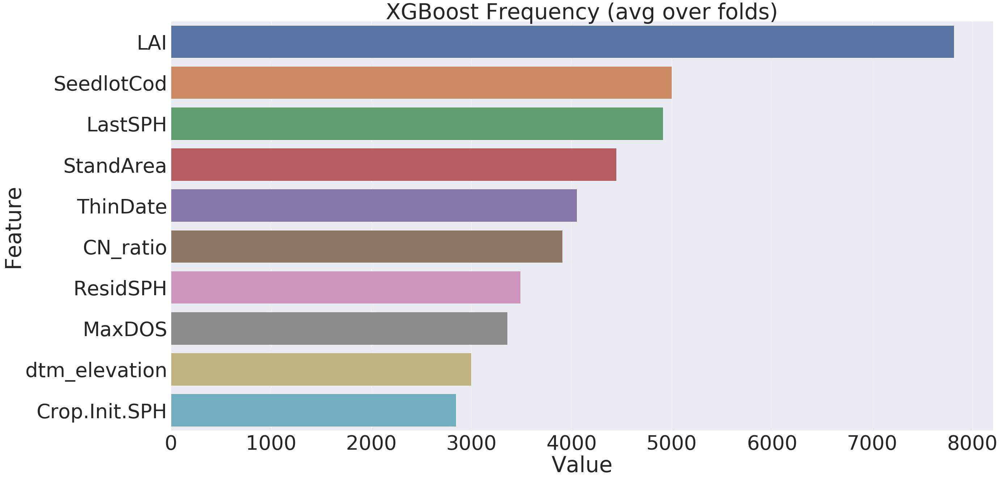

In [4]:
## Feature importance from frequency for XGBoost
feat_imp=modelXGB_final.get_score(importance_type='weight')
feat_imp=pd.DataFrame(sorted(zip(feat_imp.values(), feat_imp.keys())), columns=['Value','Feature'])
feat_imp.loc[feat_imp['Feature'].isin(['laimapv2_filtered_25m_50vht']), 'Feature']= 'LAI'
feat_imp.loc[feat_imp['Feature'].isin(['dtm_elev_10']), 'Feature']='dtm_elevation'
feat_imp.loc[feat_imp['Feature'].isin(['cn_rk5']), 'Feature']='CN_ratio'
## Plot the features
plt.figure(figsize=(40,20))
sns.set(font_scale=5)
sns.barplot(x="Value", y="Feature", data= feat_imp.sort_values(by="Value", ascending=False)[0:10])
plt.title("XGBoost Frequency (avg over folds)")
plt.tight_layout()
plt.savefig("/media/PDrive/Work/ImportanceFreqXGB.png")
plt.show()

In [5]:
## Not sure Catboost has a frequency gain
# modelCAT_final.get_feature_importance(type='PredictionValuesChange', prettified=True)

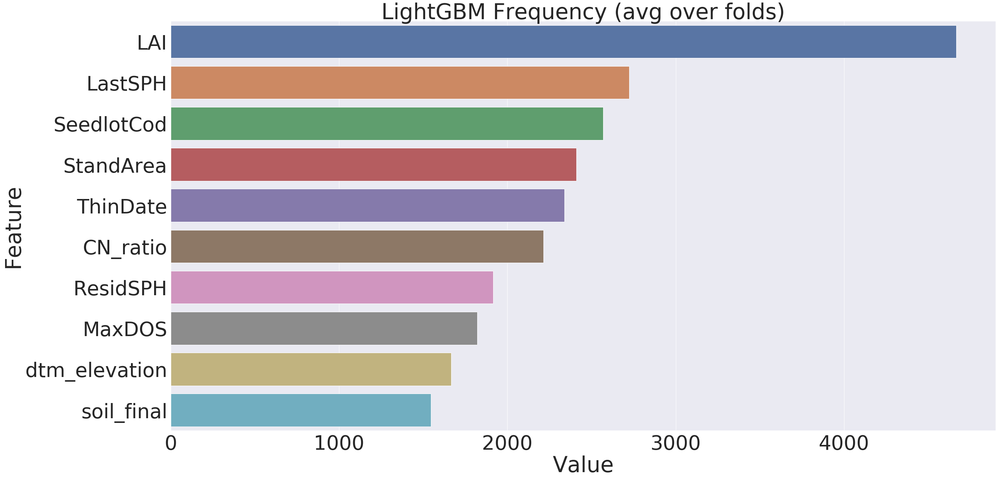

In [6]:
## Feature importance from frequency for LightGBM
feat_imp=pd.DataFrame(sorted(zip(modelLGB_final.feature_importance(), columnName)), columns=['Value','Feature'])
## Plot the figure
plt.figure(figsize=(40,20))
sns.set(font_scale=5)
sns.barplot(x="Value", y="Feature", data= feat_imp.sort_values(by="Value", ascending=False)[0:10])
plt.title("LightGBM Frequency (avg over folds)")
plt.tight_layout()
plt.savefig("/media/PDrive/Work/ImportanceFreqLGBM.png")
plt.show()

# Gain Importance

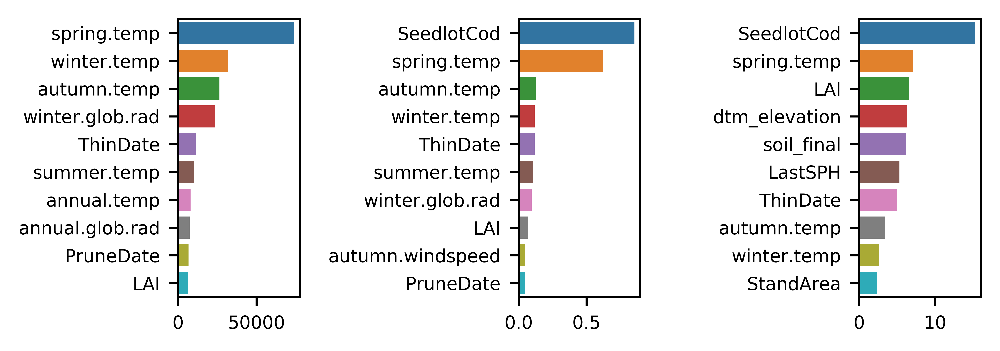

In [21]:
## All
plt.figure(figsize=(5.5, 2), dpi=1000)
ax= plt.subplot(1,3,1, facecolor='white')

feat_imp=modelXGB_final.get_score(importance_type='gain')
feat_imp=pd.DataFrame(sorted(zip(feat_imp.values(), feat_imp.keys())), columns=['Value','Feature'])
feat_imp.loc[feat_imp['Feature'].isin(['laimapv2_filtered_25m_50vht']), 'Feature']= 'LAI'
sns.barplot(x="Value", y="Feature", data= feat_imp.sort_values(by="Value", ascending=False)[0:10], ax=ax)
ax.set_xlabel('')
# ax.set_xlabel('a) XGBoost', fontsize=7)
ax.set_ylabel('')
ax.tick_params(axis='both', labelsize=7)

ax2= plt.subplot(1,3,2, facecolor='white')
feat_imp=pd.DataFrame(sorted(zip(modelLGB_noGPU_final.feature_importance(importance_type='gain'), columnName)), columns=['Value','Feature'])
sns.barplot(x="Value", y="Feature", data= feat_imp.sort_values(by="Value", ascending=False)[0:10], ax=ax2)
ax2.set_xlabel('')
# ax2.set_xlabel('b) LightGBM', fontsize=7)
ax2.set_ylabel('')
ax2.tick_params(axis='both', which='both', labelsize=7)
ax2.xaxis.get_offset_text().set_visible(False)


ax3= plt.subplot(1,3,3, facecolor='white')
feat_imp=pd.DataFrame(sorted(zip(modelCAT_final.feature_importances_, columnName)), columns=['Value','Feature'])
sns.barplot(x="Value", y="Feature", data= feat_imp.sort_values(by="Value", ascending=False)[0:10], ax=ax3)
# ax3.set_xlabel('c) CatBoost', fontsize=7)
ax3.set_xlabel('')
ax3.set_ylabel('')
ax3.tick_params(axis='both', labelsize=7)


plt.tight_layout()
# plt.savefig("/media/PDrive/Work/ImportanceGainsAll.tiff")
plt.savefig("/media/PDrive/Work/ImportanceGainsAll2.pdf")
plt.show()


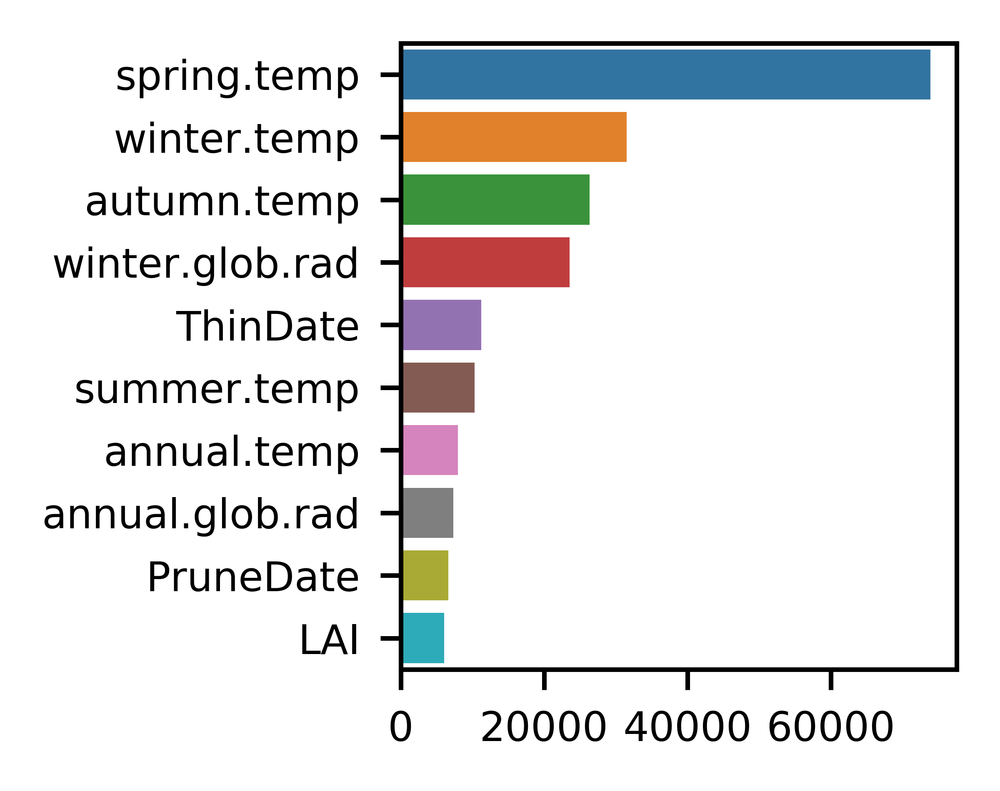

In [4]:
## Feature importance from gain for XGBoost
feat_imp=modelXGB_final.get_score(importance_type='gain')
feat_imp=pd.DataFrame(sorted(zip(feat_imp.values(), feat_imp.keys())), columns=['Value','Feature'])
feat_imp.loc[feat_imp['Feature'].isin(['laimapv2_filtered_25m_50vht']), 'Feature']= 'LAI'

plt.figure(figsize=(2.5, 2), dpi=1000)
ax= plt.subplot(1,1,1, facecolor='white')
sns.barplot(x="Value", y="Feature", data= feat_imp.sort_values(by="Value", ascending=False)[0:10], ax=ax)

ax.set_xlabel('')
ax.set_ylabel('')
ax.tick_params(axis='both', labelsize=7)

plt.tight_layout()
plt.savefig("/media/PDrive/Work/ImportanceGainXGB.pdf")
plt.show()

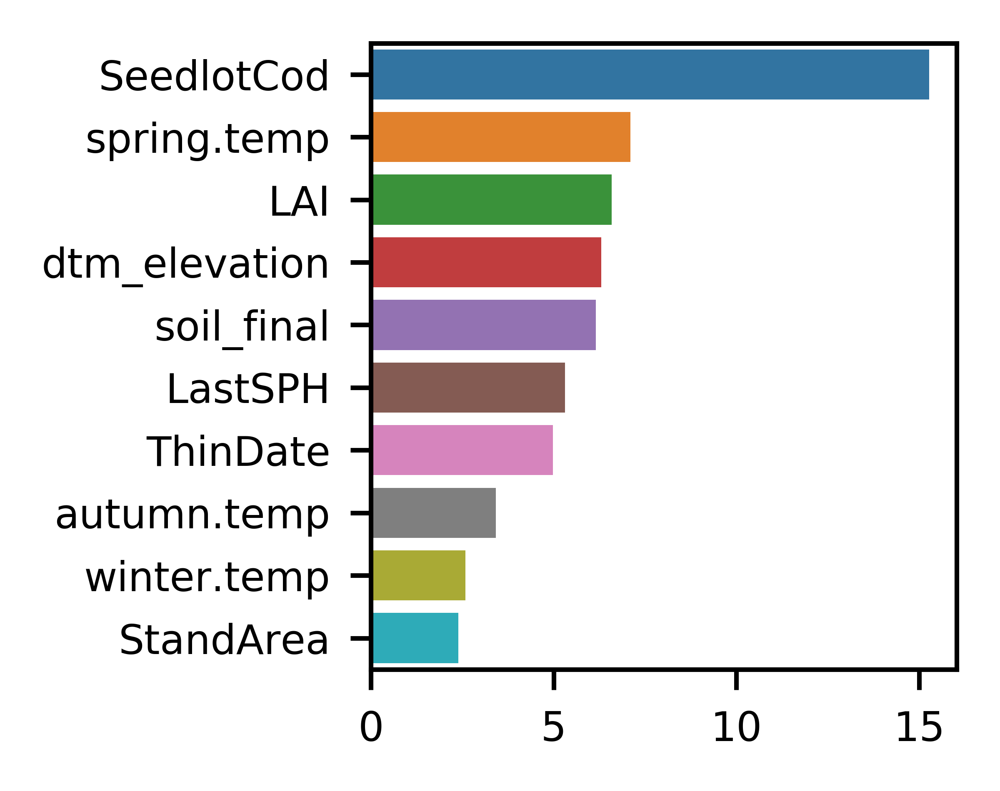

In [8]:
## Feature importance from gain from CatBoost
feat_imp=pd.DataFrame(sorted(zip(modelCAT_final.feature_importances_, columnName)), columns=['Value','Feature'])

plt.figure(figsize=(2.5, 2), dpi=1000)
ax= plt.subplot(1,1,1, facecolor='white')
sns.barplot(x="Value", y="Feature", data= feat_imp.sort_values(by="Value", ascending=False)[0:10], ax=ax)

ax.set_xlabel('')
ax.set_ylabel('')
ax.tick_params(axis='both', labelsize=7)

plt.tight_layout()
plt.savefig("/media/PDrive/Work/ImportanceGainCAT.pdf")
plt.show()

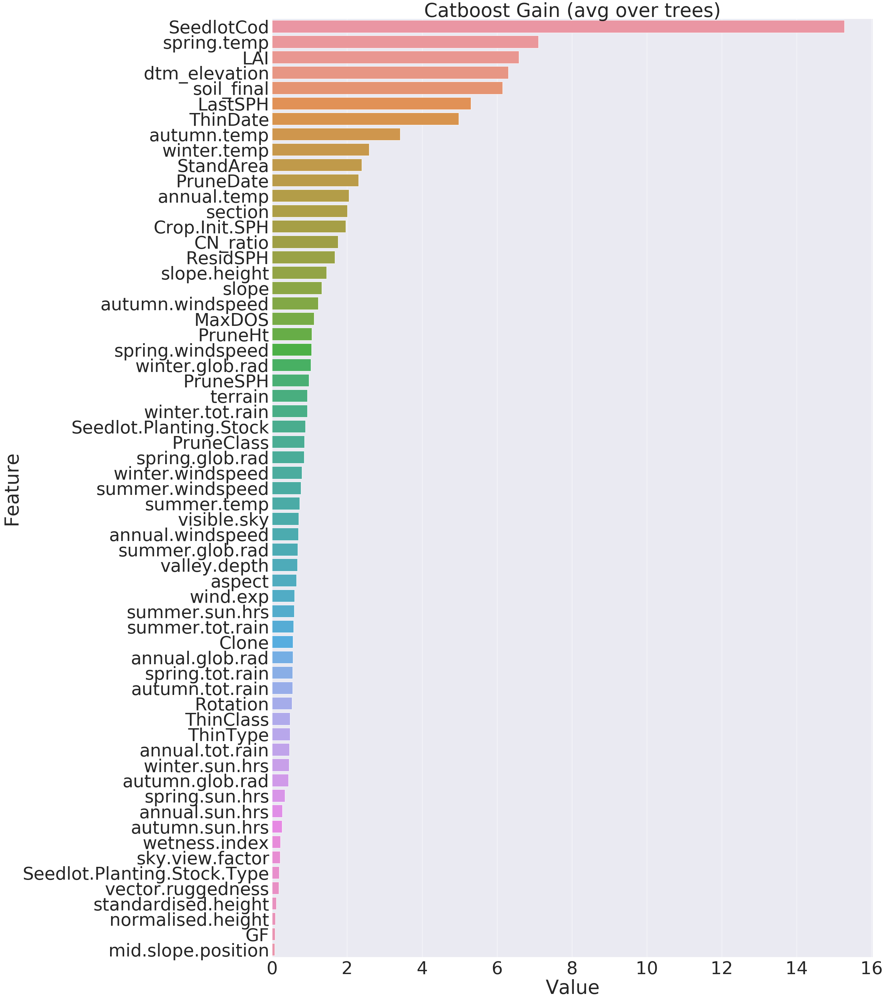

In [6]:
## Feature importance from gain from CatBoost
feat_imp=pd.DataFrame(sorted(zip(modelCAT_final.feature_importances_, columnName)), columns=['Value','Feature'])
plt.figure(figsize=(40,45))
sns.set(font_scale=5)
sns.barplot(x="Value", y="Feature", data= feat_imp.sort_values(by="Value", ascending=False))
plt.title("Catboost Gain (avg over trees)")
plt.tight_layout()
plt.savefig("/media/PDrive/Work/ImportanceGainCAT_full.png")
plt.show()

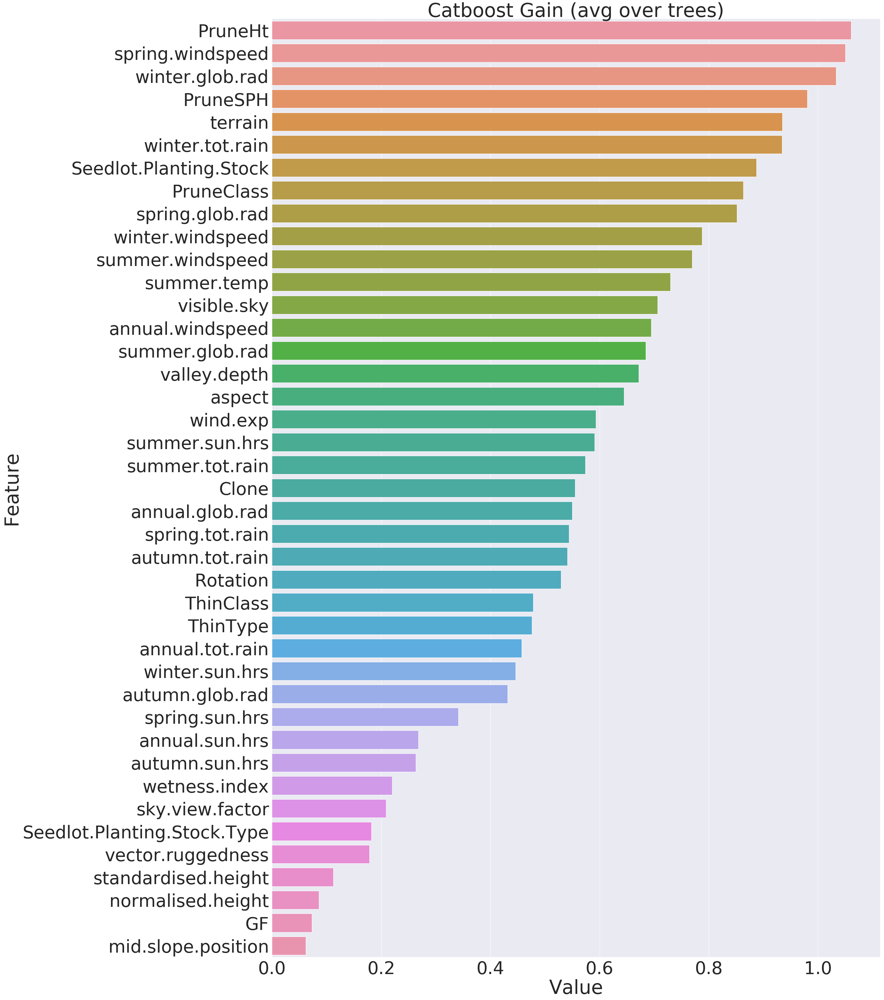

In [7]:
## Less important features from gain from CatBoost
feat_imp=pd.DataFrame(sorted(zip(modelCAT_final.feature_importances_, columnName)), columns=['Value','Feature'])
plt.figure(figsize=(40,45))
sns.set(font_scale=5)
sns.barplot(x="Value", y="Feature", data= feat_imp.sort_values(by="Value", ascending=False)[20:])
plt.title("Catboost Gain (avg over trees)")
plt.tight_layout()
plt.savefig("/media/PDrive/Work/ImportanceGainCAT_last.png")
plt.show()

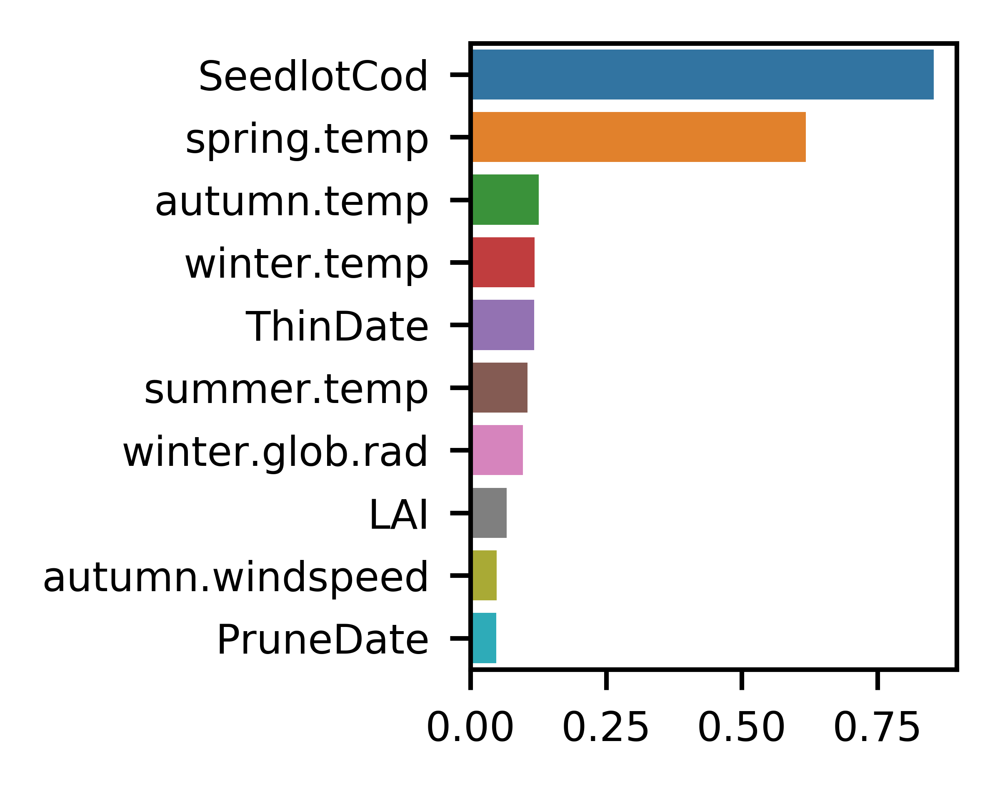

In [9]:
## Feature importance from gain from LightGBM
feat_imp=pd.DataFrame(sorted(zip(modelLGB_noGPU_final.feature_importance(importance_type='gain'), columnName)), columns=['Value','Feature'])

plt.figure(figsize=(2.5, 2), dpi=1000)
ax= plt.subplot(1,1,1, facecolor='white')
sns.barplot(x="Value", y="Feature", data= feat_imp.sort_values(by="Value", ascending=False)[0:10], ax=ax)

ax.set_xlabel('')
ax.set_ylabel('')
ax.tick_params(axis='both', labelsize=7)
ax.xaxis.get_offset_text().set_visible(False)
plt.tight_layout()
plt.savefig("/media/PDrive/Work/ImportanceGainLGBM.pdf")
plt.show()

# Sharpley Values

### XGBoost

In [13]:
## Compute the Shapley values
shap_values_XGB= shap.TreeExplainer(modelXGB_final).shap_values(X_cat)

In [10]:
## Save the shapley values
# with open("saveModels/shapValuesXGBM.dat", "wb") as f:
#     pickle.dump(shap_values_XGB, f)
    
## Load the shapley values    
with open("saveModels/shapValuesXGBM.dat", "rb") as f:
    shap_values_XGB= pickle.load(f)    

In [22]:
## Plot the shapley values
plt.figure(figsize=(2.5, 3), dpi=1000)
plt.rcParams['font.size']=10
shap.summary_plot(shap_values_XGB, X_cat, columnName, show=False, color_bar=False)
plt.tight_layout()
plt.savefig("/media/PDrive/Work/ShapleyXGB.pdf")
# plt.show()

### CatBoost

In [5]:
catFeatures=['ThinType', 'Clone', 'ThinClass', 'PruneClass', 'Seedlot.Planting.Stock', 
             'Seedlot.Planting.Stock.Type', 'SeedlotCod', 'soil_final']

cat_features_index= [X_cat.columns.get_loc(c) for c in catFeatures if c in X_cat]
## Compute the Shapley values
shap_values_CAT= modelCAT_final.get_feature_importance(cb.Pool(data=X_cat, label=Y, cat_features= cat_features_index, has_header=True), 
                                                   type="ShapValues", prettified=True)

The model has complex ctrs, so the SHAP values will be calculated approximately.


In [13]:
# with open("saveModels/shapValuesCATM.dat", "wb") as f:
#     pickle.dump(shap_values_CAT, f)
    
with open("saveModels/shapValuesCATM.dat", "rb") as f:
    shap_values_CAT= pickle.load(f)

In [14]:
## Plot the shapley values
plt.figure(figsize=(1.5, 3), dpi=1000)
shap.summary_plot(shap_values_CAT[:,:-1], X_cat, columnName, show=False)
plt.tight_layout()
plt.savefig("/media/PDrive/Work/ShapleyCAT.pdf")
# plt.show()

### LightGB

In [4]:
## Compute the Shapley values
shap_values_LGB= shap.TreeExplainer(modelLGB_final).shap_values(X_cat)

In [5]:
# with open("saveModels/shapValuesLGBM.dat", "wb") as f:
#     pickle.dump(shap_values_LGB, f)
    
# with open("saveModels/shapValuesLGBM.dat", "rb") as f:
#     shap_values_LGB= pickle.load(f)    

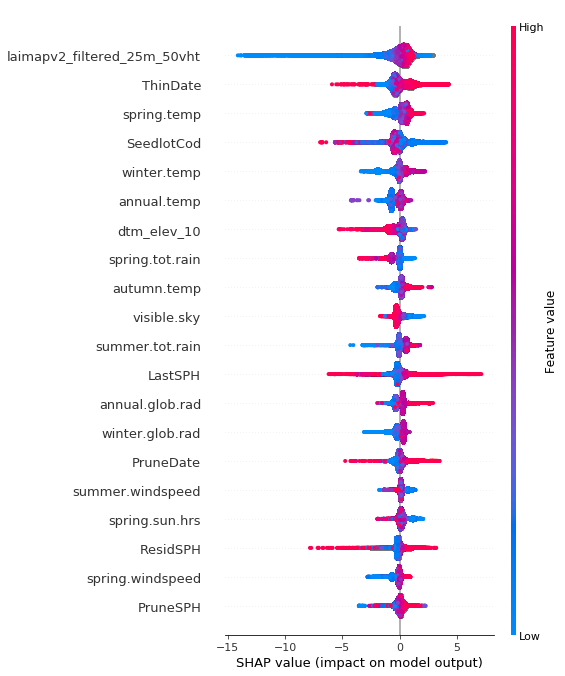

In [11]:
## Plot the shapley values
plt.figure(figsize=(40,20))
shap.summary_plot(shap_values_LGB, X_cat, show=False)
plt.tight_layout()
plt.savefig("/media/PDrive/Work/ShapleyLGBM.pdf")
# plt.show()

In [4]:
## Compute the Shapley values
shap_values_LGB_noGPU= shap.TreeExplainer(modelLGB_noGPU_final).shap_values(X_cat)

In [7]:
with open("saveModels/shapValuesLGBM_noGPU.dat", "rb") as f:
    shap_values_LGB_noGPU= pickle.load(f)   

In [16]:
## Plot the shapley values
plt.figure(figsize=(1.5, 3), dpi=1000)
shap.summary_plot(shap_values_LGB_noGPU, X_cat, columnName, show=False, color_bar=False)
plt.tight_layout()
plt.savefig("/media/PDrive/Work/ShapleyLGBM_noGPU.png")

In [ ]:
with open("saveModels/shapValuesXGBM.dat", "rb") as f:
    shap_values_XGB= pickle.load(f)    
    
with open("saveModels/shapValuesCATM.dat", "rb") as f:
    shap_values_CAT= pickle.load(f)
    
with open("saveModels/shapValuesLGBM_noGPU.dat", "rb") as f:
    shap_values_LGB_noGPU= pickle.load(f)        

## Plot All for paper
plt.figure(figsize=(5.5, 2), dpi=1000)
plt.subplot(1,3,1, facecolor='white')
shap.summary_plot(shap_values_XGB, X_cat, show=False, color_bar=False)
# ax.set_xlabel('')
# ax.set_ylabel('')


plt.subplot(1,3,2, facecolor='white')
shap.summary_plot(shap_values_CAT[:,:-1], X_cat, columnName, show=False, color_bar=False)
# ax2.set_xlabel('')
# ax2.set_ylabel('')

plt.subplot(1,3,3, facecolor='white')
shap.summary_plot(shap_values_LGB_noGPU, X_cat)
# ax3.set_xlabel('')
# ax3.set_ylabel('')


plt.tight_layout()
plt.savefig("/media/PDrive/Work/ShapleyALL.pdf")
plt.show()


## Partial dependencies

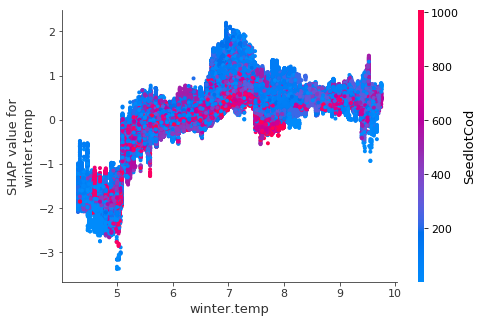

In [6]:
shap.dependence_plot("winter.temp", shap_values_LGB, X_cat, interaction_index="SeedlotCod", show=False)
# f=plt.gca().get_figure()
# f.set_size_inches(40,20)
# plt.tight_layout()
plt.savefig("/media/PDrive/Work/WinterSeedlotLGBM.png")

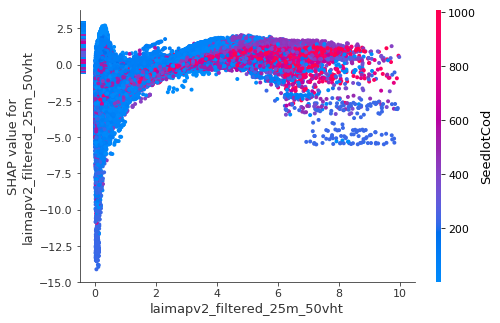

In [9]:
shap.dependence_plot("laimapv2_filtered_25m_50vht", shap_values_LGB, X_cat, interaction_index="SeedlotCod", show=False)
# f=plt.gca().get_figure()
# f.set_size_inches(40,20)
# plt.tight_layout()
plt.savefig("/media/PDrive/Work/LAISeedlotLGBM.png")

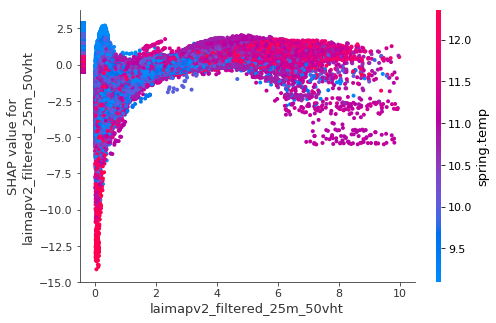

In [11]:
shap.dependence_plot("laimapv2_filtered_25m_50vht", shap_values_LGB, X_cat, interaction_index="spring.temp", show=False)
# f=plt.gca().get_figure()
# f.set_size_inches(40,20)
# plt.tight_layout()
plt.savefig("/media/PDrive/Work/LAISpringTempLGBM.png")

/home/bombrunm/anaconda3/lib/python3.7/site-packages/matplotlib/colors.py:512: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


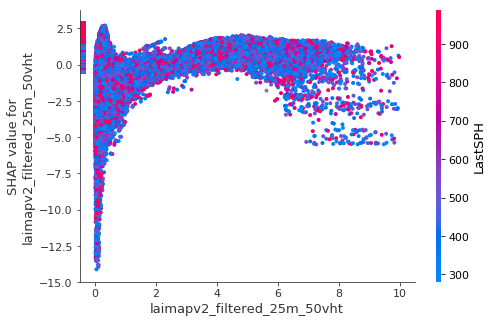

In [10]:
shap.dependence_plot("laimapv2_filtered_25m_50vht", shap_values_LGB, X_cat, show=False)
# f=plt.gca().get_figure()
# f.set_size_inches(40,20)
# plt.tight_layout()
plt.savefig("/media/PDrive/Work/LAIAutoLGBM.png")